# NDT Internet Speed Prediction using Deep Learning

**Author:** Wen Bo Li and Patricia Wei

**Date:** May 19, 2023


# Set up authentication

Run `gcloud auth application-default login --no-browser` and follow the instructions.

https://pandas-gbq.readthedocs.io/en/latest/howto/authentication.html#authenticating-with-a-user-account

In [1]:
try: auth
except: 
  !apt update
  !pip install pandas google-cloud-storage

  import pandas as pd
  from google.colab import auth

print (pd.__version__)
auth.authenticate_user()

Get:1 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Hit:5 http://archive.ubuntu.com/ubuntu focal InRelease
Get:6 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:7 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:8 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [2,774 kB]
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:10 http://security.ubuntu.com/ubuntu focal-security/universe amd64 Packages [1,057 kB]
Get:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease [18.1 kB]
Hit:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Get:13 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 Packages

# Getting the Raw Data

## Imports/utilities for Queries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from scipy import stats
import re
import statistics

import seaborn as sns
import matplotlib as mpl

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import FormatStrFormatter
from matplotlib.pyplot import figure

from datetime import datetime
from datetime import date
from datetime import timedelta
from dateutil.parser import parse as dateparser
import pytz
from pytz import timezone

from collections import defaultdict

import warnings
warnings.filterwarnings('ignore')

utc_tz = pytz.timezone('UTC')

print("Hello, world!")

Hello, world!


## Helpers

In [3]:
def get_dists(df, col):
  # Frequency
  stats_df = df \
  .groupby(col) \
  [col] \
  .agg('count') \
  .pipe(pd.DataFrame) \
  .rename(columns = {col: 'frequency'})

  # PDF
  stats_df['pdf'] = stats_df['frequency'] / sum(stats_df['frequency'])

  # CDF
  stats_df['cdf'] = stats_df['pdf'].cumsum()
  stats_df = stats_df.reset_index()
  return stats_df

## Query Parameters


In [4]:
start_date = '2023-02-01'
end_date = '2023-02-03'

start_time = f'{start_date} 00:00:00 UTC'
end_time = f'{end_date} 23:59:59 UTC'
start_time_dt = datetime.strptime(start_time, '%Y-%m-%d %H:%M:%S UTC')
end_time_dt = datetime.strptime(end_time, '%Y-%m-%d %H:%M:%S UTC')

num_days = 1
min_datapoints = 1
min_daily_datapoints = 1
min_duration = 1 #seconds

mlab_project = 'measurement-lab'

## Very Small Query Parameters so the query actually finishes

In [5]:
start_date = '2023-02-01'
end_date = '2023-02-01'

start_time = f'{start_date} 00:00:00 UTC'
end_time = f'{end_date} 0:1:59 UTC'
start_time_dt = datetime.strptime(start_time, '%Y-%m-%d %H:%M:%S UTC')
end_time_dt = datetime.strptime(end_time, '%Y-%m-%d %H:%M:%S UTC')

num_days = 1
min_datapoints = 1
min_daily_datapoints = 1
min_duration = 1 #seconds

mlab_project = 'measurement-lab'

## Query

### Subqueries

In [6]:
def get_bytes_sample(bytes_MB):
  return f'''
bytes_sample_{bytes_MB}MB AS (
  SELECT
    UUID,
    ARRAY (
      SELECT
        AS STRUCT *
      FROM
        UNNEST(Snapshots)
      WHERE
        BytesAcked < {bytes_MB*1e6}
      ORDER BY
        BytesAcked DESC
    ) AS Snapshots_sample
  FROM
    preprocessed
),
bytes_cum_sample_{bytes_MB}MB AS (
  SELECT
    UUID,
  IF
    (ARRAY_LENGTH(Snapshots_sample) > 0,
        Snapshots_sample[OFFSET(0)].CumAvgMbps, -1) AS Cum_Estimates_{bytes_MB}MB
  FROM
    bytes_sample_{bytes_MB}MB
),
bytes_p5_sample_{bytes_MB}MB AS (
  WITH
    tmp AS (
      SELECT
        UUID,
        APPROX_QUANTILES(CurrAvgMbps, 100)[OFFSET(5)] AS p5
      FROM
        bytes_sample_{bytes_MB}MB, UNNEST(Snapshots_sample)
      GROUP BY
        UUID
    )
  SELECT
    bytes_sample_{bytes_MB}MB.UUID,
    AVG(CurrAvgMbps) AS Sampled_Estimates_{bytes_MB}MB
  FROM
    bytes_sample_{bytes_MB}MB, UNNEST(Snapshots_sample)
  JOIN
    tmp
  ON
    tmp.UUID = bytes_sample_{bytes_MB}MB.UUID
  WHERE
    CurrAvgMbps > p5
  GROUP BY
    1
)
'''

def bytes_inner_join(bytes_MB):
  return f'''
INNER JOIN bytes_cum_sample_{bytes_MB}MB
ON bytes_cum_sample_{bytes_MB}MB.UUID = preprocessed.UUID
INNER JOIN bytes_p5_sample_{bytes_MB}MB
ON bytes_p5_sample_{bytes_MB}MB.UUID = preprocessed.UUID
'''

### Simplified Query

In [7]:
def get_data_v3(start_date, end_date, start_time, end_time, min_daily_datapoints, num_days, min_datapoints, min_duration, to_print=False):
  query = f'''
WITH
preprocessed AS (
  SELECT
    ndt7.raw.Download.UUID AS UUID,
    ndt7.raw.ClientIP AS ClientIP,
    ndt7.Server.Site AS Site,
    ndt7.a.TestTime AS TestTime,
    ndt7.a.MeanThroughputMbps AS ReturnedThroughputMbps,
    TIMESTAMP_DIFF(ndt7.raw.Download.EndTime, ndt7.raw.Download.StartTime, SECOND) AS Duration_s,
    (SELECT max(ServerMeasurements.TCPInfo.BytesAcked)
      FROM UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
    ) AS TotalBytesAcked,
    ARRAY (
      (
        SELECT AS STRUCT
          ROW_NUMBER() OVER snaps AS row_num,
          TIMESTAMP_DIFF(SM.Timestamp, SM.FirstTimestamp, MICROSECOND) as ElapsedTime_us,
          BytesAcked,
          IFNULL(TIMESTAMP_DIFF(SM.Timestamp, LAG(SM.Timestamp, 1) OVER snaps, MICROSECOND), 0) AS DeltaTime_us,
          IFNULL(BytesAcked - LAG(SM.BytesAcked, 1) OVER snaps, 0) AS DeltaBytes,
          IFNULL(SAFE_DIVIDE(((BytesAcked - LAG(SM.BytesAcked, 1) OVER snaps)/1e6)*8 , TIMESTAMP_DIFF(SM.Timestamp, LAG(SM.Timestamp, 1) OVER snaps, MICROSECOND)/1e6), 0) AS CurrAvgMbps,
          IFNULL(SAFE_DIVIDE((BytesAcked/1e6)*8, TIMESTAMP_DIFF(SM.Timestamp, FirstTimestamp, MICROSECOND)/1e6), 0) AS CumAvgMbps
        FROM (
          SELECT *
          FROM
            (
              (
                SELECT
                  ServerMeasurements.TCPInfo.BytesAcked,
                  ServerMeasurements.Timestamp
                  FROM
                    UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
              )
                CROSS JOIN
              (
                SELECT
                  MIN(ServerMeasurements.Timestamp) AS FirstTimestamp FROM
                  UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
              )
            )
        ) AS SM
        WINDOW 
          snaps AS (ORDER BY SM.Timestamp)
      )
    ) AS Snapshots
FROM
  `measurement-lab.ndt.tcpinfo` AS tcpinfo
INNER JOIN
  `measurement-lab.ndt.ndt7` AS ndt7
ON ndt7.raw.Download.UUID = tcpinfo.raw.MetaData.UUID
INNER JOIN
  `measurement-lab.ndt.unified_downloads` AS unified_downloads
ON unified_downloads.a.UUID = tcpinfo.raw.MetaData.UUID
  WHERE
    (ndt7.date BETWEEN '{start_date}' AND '{end_date}')
    AND (tcpinfo.date BETWEEN '{start_date}' AND '{end_date}')
    AND (unified_downloads.date BETWEEN '{start_date}' AND '{end_date}')
    AND ndt7.a.TestTime >= TIMESTAMP('{start_time}')
    AND ndt7.a.TestTime <= TIMESTAMP('{end_time}')
)

SELECT
  preprocessed.UUID,
  preprocessed.ClientIP,
  Site,
  TestTime,
  TotalBytesAcked,
  Duration_s,
  ReturnedThroughputMbps,
  Snapshots
FROM
  preprocessed
WHERE
  ARRAY_LENGTH(preprocessed.Snapshots) > 0
  AND Duration_s > {min_duration}
'''

  if to_print:
    print(query)
  return pd.read_gbq(query, project_id=mlab_project)

### Make the Query

In [8]:
df_v3 = get_data_v3(start_date, end_date, start_time, end_time, min_daily_datapoints, num_days, min_datapoints, min_duration, to_print=False)

In [9]:
df_v3['Cum_Estimate_full'] = (df_v3.TotalBytesAcked/df_v3.Duration_s)/1e6

## Total tests
print(f"{len(df_v3)} tests")
print(f"{len(df_v3.ClientIP.unique())} client IPs")

4784 tests
3476 client IPs


## Bytes per test (sanity check of data)

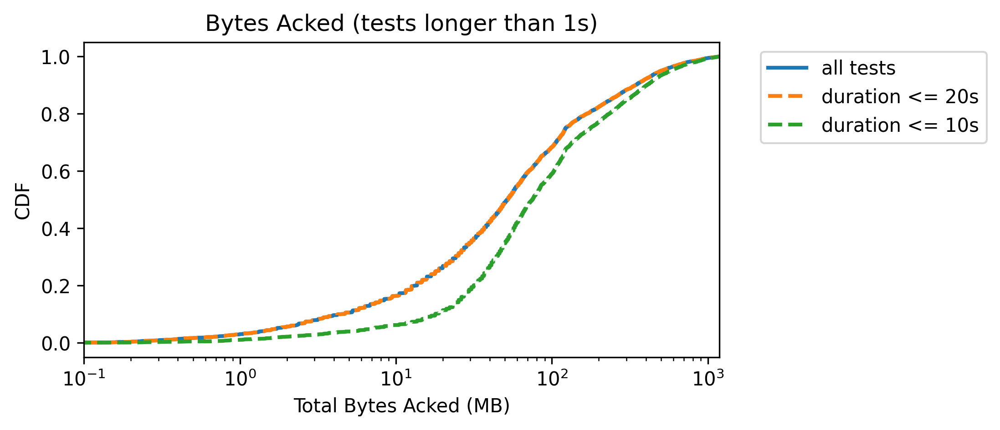

In [10]:
data_dist = get_dists(df_v3, 'TotalBytesAcked')
data_dist_lt20s = get_dists(df_v3[df_v3.Duration_s <= 20], 'TotalBytesAcked')
data_dist_lt10s = get_dists(df_v3[df_v3.Duration_s <= 10], 'TotalBytesAcked')

fig, ax = plt.subplots(dpi=300, figsize=(6,3))
ax.plot(data_dist.TotalBytesAcked/1e6, data_dist.cdf, linewidth=2, label='all tests')
ax.plot(data_dist_lt20s.TotalBytesAcked/1e6, data_dist_lt20s.cdf, linewidth=2, linestyle='--', label='duration <= 20s')
ax.plot(data_dist_lt10s.TotalBytesAcked/1e6, data_dist_lt10s.cdf, linewidth=2, linestyle='--', label='duration <= 10s')

ax.set_xscale('log')
ax.set_xlim(0.1, max(df_v3.TotalBytesAcked)/1e6)
ax.set_xlabel('Total Bytes Acked (MB)')
ax.set_ylabel("CDF")
ax.set_title(f"Bytes Acked (tests longer than {min_duration}s)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

print()

In [11]:
print(f"Most bytes transferred {max(df_v3.TotalBytesAcked)/1e6}MB")

Most bytes transferred 1186.590412MB


## Time series of a single test

In [12]:
print(df_v3.keys())
dp = df_v3
print("dp.TotalBytesAcked", dp.TotalBytesAcked[0])
print("dp.Duration_s", dp.Snapshots[0][-1]["ElapsedTime_us"], dp.Snapshots[1][-1]["ElapsedTime_us"])
print("# of snapshots", len(dp.Snapshots[0]), len(dp.Snapshots[1]))
print("avg throughput:", dp.TotalBytesAcked[0] * 8 / dp.Duration_s[0] / 1e6)
print("returned mean throughput:", dp.ReturnedThroughputMbps[0])
dp["Snapshots"][8]
#dp["Snapshots"][1][:10]

# Observations
# 1. Delta between timestamps are not uniform and not predictable.
# 2. Total test time is not constant.
# 3. Total number of snapshots is not constant.
# 4. "ReturnedThroughputMbps" does NOT match a naive (Bytes/ElapsedTime) computation.
#   4a. Question: is ReturnedThroughputMbps the ground truth?

Index(['UUID', 'ClientIP', 'Site', 'TestTime', 'TotalBytesAcked', 'Duration_s',
       'ReturnedThroughputMbps', 'Snapshots', 'Cum_Estimate_full'],
      dtype='object')
dp.TotalBytesAcked 10516547
dp.Duration_s 16490020 26886310
# of snapshots 146 31
avg throughput: 6.471721230769231
returned mean throughput: 5.2934640899745355


array([{'row_num': 1, 'ElapsedTime_us': 0, 'BytesAcked': 0, 'DeltaTime_us': 0, 'DeltaBytes': 0, 'CurrAvgMbps': 0.0, 'CumAvgMbps': 0.0},
       {'row_num': 2, 'ElapsedTime_us': 173552, 'BytesAcked': 679237, 'DeltaTime_us': 173552, 'DeltaBytes': 679237, 'CurrAvgMbps': 31.30990135521342, 'CumAvgMbps': 31.30990135521342},
       {'row_num': 3, 'ElapsedTime_us': 396634, 'BytesAcked': 21058183, 'DeltaTime_us': 223082, 'DeltaBytes': 20378946, 'CurrAvgMbps': 730.814534565765, 'CumAvgMbps': 424.7378288296011},
       {'row_num': 4, 'ElapsedTime_us': 1202926, 'BytesAcked': 27078967, 'DeltaTime_us': 806292, 'DeltaBytes': 6020784, 'CurrAvgMbps': 59.738000625083714, 'CumAvgMbps': 180.08733371795105},
       {'row_num': 5, 'ElapsedTime_us': 1799652, 'BytesAcked': 37592999, 'DeltaTime_us': 596726, 'DeltaBytes': 10514032, 'CurrAvgMbps': 140.95624457456188, 'CumAvgMbps': 167.11230393431617},
       {'row_num': 6, 'ElapsedTime_us': 2340044, 'BytesAcked': 47841742, 'DeltaTime_us': 540392, 'DeltaBytes': 1

### Plots of Multiple tests

In [13]:
def plot_snapshots(snapshots, returnedthroughputs, rows, cols, truncate=0, predictedthroughputs=[], predictedvars=[]):
  plotX = rows
  plotY = cols

  figure(figsize=(plotY * 2, plotX * 2))

  for i in range(plotX):
    for j in range(plotY):
      index = i * plotY + j
      data = snapshots[index]
      series = []
      timestamps = []
      baseline_series = []
      for k, snapshot in enumerate(data):
        if truncate > 0 and k == truncate:
          break
        timestamps.append(snapshot["ElapsedTime_us"] / 1e6)
        series.append(snapshot["CurrAvgMbps"])

      plt.subplot(plotX, plotY, index+1)
      plt.plot(timestamps, series)
      #plt.axhline(data[-1]["CumAvgMbps"], color='c')
      baseline = sum(series) / len(series) if truncate <= 0 else sum(series[:truncate]) / truncate
      plt.axhline(baseline, color='c')
      plt.axhline(returnedthroughputs[index], color='r')
      if len(predictedthroughputs) > 0 and len(predictedvars) > 0:
        # Plot variance
        plt.axhline(predictedthroughputs[index]-predictedvars[index], color='g')
        plt.axhline(predictedthroughputs[index]+predictedvars[index], color='g')
      elif len(predictedthroughputs) > 0:
        plt.axhline(predictedthroughputs[index], color='g')

Index(['UUID', 'ClientIP', 'Site', 'TestTime', 'TotalBytesAcked', 'Duration_s',
       'ReturnedThroughputMbps', 'Snapshots', 'Cum_Estimate_full'],
      dtype='object')


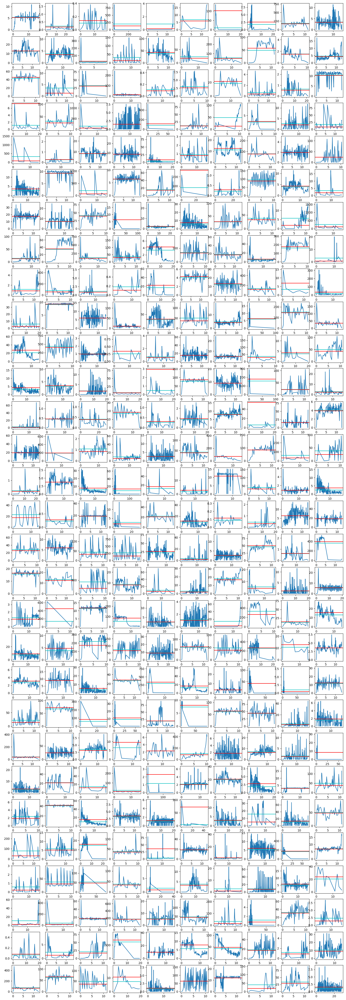

In [14]:
print(df_v3.keys())
plot_snapshots(df_v3.Snapshots, df_v3.ReturnedThroughputMbps, 30, 10)

# First model -- baseline

The first model will be just use the first INPUT_TRUNCATE_SNAPSHOTS datapoints. If there are less than MINIMUM_SNAPSHOTS datapoints in total then the test will not be used.

## Imports/Utilities for Tensorflow

In [20]:
import h5py
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.python.framework.ops import EagerTensor
from tensorflow.python.ops.resource_variable_ops import ResourceVariable
import time
import keras_tuner as kt
from tensorflow import keras

tf.__version__

'2.12.0'

## Utilities for Creating training/dev/test

### Visualizing how many snaphots each test has

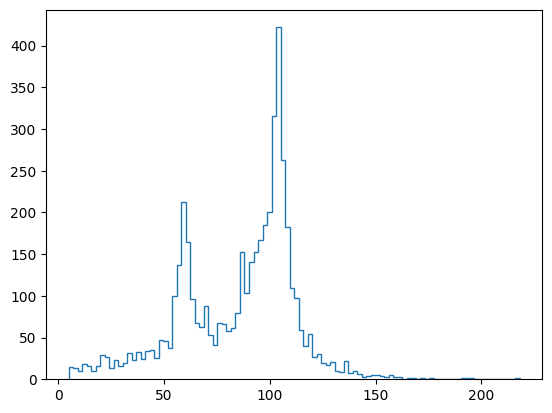

In [21]:
frequencies = []
for snapshots in df_v3.Snapshots:
  frequencies.append(len(snapshots))

counts, bins = np.histogram(frequencies, bins=100)
plt.stairs(counts, bins)

#### get_valid_serieses

In [22]:
# INPUT_TRUNCATE_SNAPSHOTS is the number of snapshots with which we will predict
# the final bandwidth.
#########INPUT_TRUNCATE_SNAPSHOTS = 80
# MINIMUM_SNAPSHOTS is an important number: it filters the dataset such that
# only the tests with at least this many number of datapoints is given a
# prediction.
#
# We can tweak this number such that only, say, tests with 50, or 70 datapoints
# are retained as "good tests". In order to do that though we would need a good
# rationale.
#########MINIMUM_SNAPSHOTS = 80

truncateNs = list(range(30, 71, 10))

# get_valid_serieses returns all tests that contains the minimum number of snapshots
def get_valid_serieses(minSnapshotsN):
  valid_serieses = []
  valid_returnedthroughputs = []
  for i in range(len(df_v3.Snapshots)):
    if len(df_v3.Snapshots[i]) >= minSnapshotsN:
      valid_serieses.append(df_v3.Snapshots[i])
      valid_returnedthroughputs.append(df_v3.ReturnedThroughputMbps[i])
  return valid_serieses, valid_returnedthroughputs

### Visualizing tests with `MINIMUM_SNAPSHOTS`



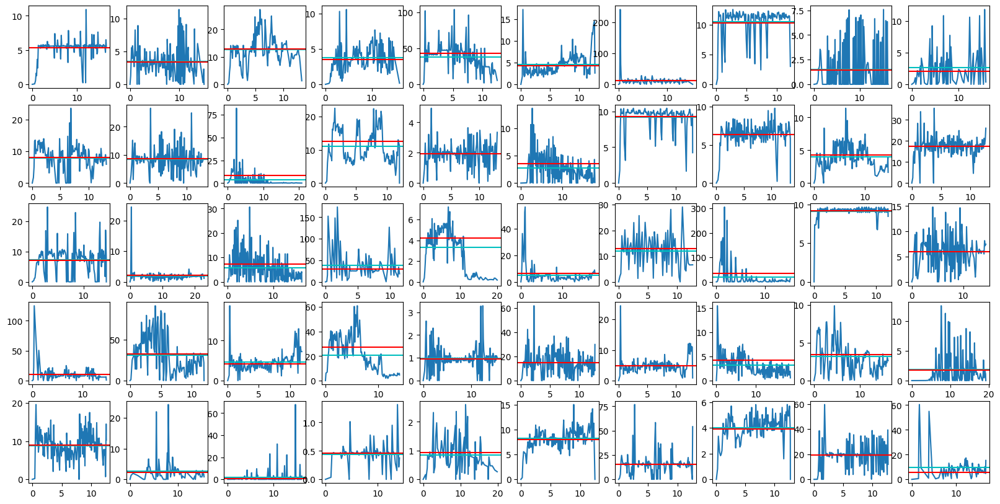

In [23]:
# Whether to enable printing the visualizations
# NOTE: There is a separate flag for the later result visualizations for convenience.
plot_visualization = True

if plot_visualization:
  SNAPSHOT_TRUNC_FOR_VISUALIZATION = truncateNs[-1]
  valid_serieses, valid_returnedthroughputs = get_valid_serieses(SNAPSHOT_TRUNC_FOR_VISUALIZATION)
  plot_snapshots(valid_serieses, valid_returnedthroughputs, 5, 10)

### Visualizing tests with `MINIMUM_SNAPSHOTS` and truncated with `INPUT_TRUNCATE_SNAPSHOTS`


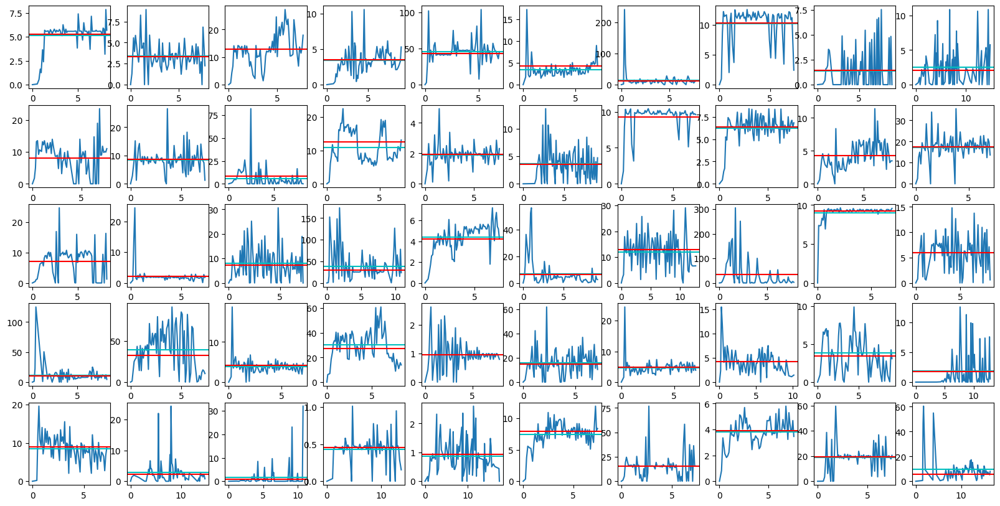

In [24]:
if plot_visualization:
  plot_snapshots(valid_serieses, valid_returnedthroughputs, 5, 10, truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION)

### Truncate and Create training/dev/test 

In [25]:
### Normalization idea: normalize everything to have the same range, but don't
### touch standard deviation or the mean (other than the range lower the mean
### proportionally).
def normalize(x, y):
  maxes = x.max(axis=1, keepdims=True)
  x /= maxes
  maxes = maxes.squeeze()
  y /= maxes

  def denormalize(y_norm):
    return y_norm * maxes
  return x, y, denormalize

def split_datasets(valid_serieses, valid_returnedthroughputs, truncateN, debug=False):
  onedim_valid_serieses = []
  labels = valid_returnedthroughputs
  for series in valid_serieses:
    onedim_series = []
    for snapshot in series[:truncateN]:
      onedim_series.append(snapshot["CurrAvgMbps"])
    onedim_valid_serieses.append(onedim_series)

  onedim_valid_serieses = np.asarray(onedim_valid_serieses)
  labels = np.asarray(labels).T

  TrainingSetEndIndex = round(len(onedim_valid_serieses) * 0.8)
  DevSetEndIndex = round(TrainingSetEndIndex + len(onedim_valid_serieses) * 0.1)
  TestSetEndIndex = len(onedim_valid_serieses)

  training_set = onedim_valid_serieses[:TrainingSetEndIndex]
  training_set_labels = labels[:TrainingSetEndIndex]
  dev_set = onedim_valid_serieses[TrainingSetEndIndex:DevSetEndIndex]
  dev_set_labels = labels[TrainingSetEndIndex:DevSetEndIndex]
  test_set = onedim_valid_serieses[DevSetEndIndex:]
  test_set_labels = labels[DevSetEndIndex:]

  training_set_unnorm, training_set_labels_unnorm = training_set.copy(), training_set_labels.copy()
  dev_set_unnorm, dev_set_labels_unnorm = dev_set.copy(), dev_set_labels.copy()
  test_set_unnorm, test_set_labels_unnorm = test_set.copy(), test_set_labels.copy()

  training_set, training_set_labels, denormalize_training = normalize(training_set, training_set_labels)
  dev_set, dev_set_labels, denormalize_dev = normalize(dev_set, dev_set_labels)
  test_set, test_set_labels, denormalize_test = normalize(test_set, test_set_labels)

  return training_set, training_set_labels, denormalize_training, training_set_labels_unnorm, dev_set, dev_set_labels, denormalize_dev, dev_set_labels_unnorm, test_set, test_set_labels, denormalize_test, test_set_labels_unnorm

## Multi-level Perceptron Model (initial model)

#### Get Data Function

In [26]:
# These maps are for visualization
valid_serieses_map, valid_returnedthroughputs_map = {}, {}

def get_input(minSnapshotN, truncateN, debug=False):
  valid_serieses, valid_returnedthroughputs = get_valid_serieses(minSnapshotN)
  valid_serieses_map[minSnapshotN], valid_returnedthroughputs_map[minSnapshotN] = valid_serieses, valid_returnedthroughputs
  training_set, training_set_labels, denormalize_training, training_set_labels_unnorm, dev_set, dev_set_labels, denormalize_dev, dev_set_labels_unnorm, test_set, test_set_labels, denormalize_test, test_set_labels_unnorm = split_datasets(valid_serieses, valid_returnedthroughputs, truncateN, debug=debug)
  x_train, y_train, x_dev, y_dev, x_test, y_test = training_set, training_set_labels, dev_set, dev_set_labels, test_set, test_set_labels
  return (
      [x_train, y_train, x_dev, y_dev, x_test, y_test],
      [denormalize_training, denormalize_dev, denormalize_test],
      [training_set_labels_unnorm, dev_set_labels_unnorm, test_set_labels_unnorm]
  )


#### Model

In [57]:
num_epochs = 50
enable_JTT = False
JTT_upsample = 10
JTT_cutoff_diff = 0.20
# Note: this is not a hyperparameter, this is the plotting density. The lower
# the number the more computation it has to run and hence the slower the training.
epoch_spacing = 20

def custom_loss(y_true, y_pred):
  loss = tf.reduce_mean(tf.pow(tf.abs(y_true - y_pred), 1.5))
  return loss

loss = tf.keras.losses.MeanSquaredError()
#loss = tf.keras.losses.MeanAbsoluteError()
metrics = [tf.keras.losses.MeanSquaredError()]
loss = custom_loss

W, b, costs, train_acc, test_acc, train_preds, test_preds, training_set_labels_unnorm, dev_set_labels_unnorm, test_set_labels_unnorm = {}, {}, {}, {}, {}, {}, {}, {}, {}, {}

tuner = {}
best_hps = {}

history = {}

denormalize_training, denormalize_dev, denormalize_test = {}, {}, {}

for truncateN in truncateNs:
  sample_weights = None
  for trainCount in range(1, 3): # Just train twice!
    if not enable_JTT and trainCount == 2:
      continue
    print(f"truncateN: {truncateN}")
    data_np, denorm_funcs, unnorm_labels = get_input(truncateN, truncateN, debug=False)

    x_train_np, y_train_np, x_dev_np, y_dev_np, x_test_np, y_test_np = data_np
    denormalize_training[truncateN], denormalize_dev[truncateN], denormalize_test[truncateN] = denorm_funcs
    training_set_labels_unnorm[truncateN], dev_set_labels_unnorm[truncateN], test_set_labels_unnorm[truncateN] = unnorm_labels

    def model_builder(hp):
      model = keras.Sequential()
      model.add(keras.Input(shape=(truncateN,)))
      # Tune the number of units in the first Dense layer
      # Choose an optimal value between 8-128
      hp_units = hp.Int('units1', min_value=8, max_value=128, step=8)
      model.add(keras.layers.Dense(units = hp_units, activation=tf.nn.leaky_relu))
      hp_units = hp.Int('units2', min_value=4, max_value=64, step=8)
      model.add(keras.layers.Dense(units = hp_units, activation=tf.nn.leaky_relu))
      model.add(keras.layers.Dense(units = 1, activation=tf.nn.leaky_relu))

      # Tune the learning rate for the optimizer
      # Choose an optimal value from 0.01, 0.001, or 0.0001
      hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                    loss=loss,
                    metrics=metrics)
      return model

    tuner[truncateN] = kt.Hyperband(model_builder,
                     objective='val_loss',
                     max_epochs=num_epochs,
                     overwrite = True)
    
    stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

    tuner[truncateN].search(x_train_np, y_train_np, epochs=50, validation_data=(x_test_np, y_test_np), callbacks=[stop_early])

    # Get the optimal hyperparameters
    best_hps[truncateN]=tuner[truncateN].get_best_hyperparameters(num_trials=1)[0]

    print(f"""
    The hyperparameter search is complete. The optimal number of units in the densely-connected
    layers are [{best_hps[truncateN].get('units1')}, {best_hps[truncateN].get('units2')}]
    and the optimal learning rate for the optimizer is {best_hps[truncateN].get('learning_rate')}.
    """)

    # Build the model with the optimal hyperparameters and train it on the data for 50 epochs
    model = tuner[truncateN].hypermodel.build(best_hps[truncateN])
        
    print(f"{x_train_np.shape}, {y_train_np.shape}")
    history[truncateN] = model.fit(
        x_train_np,
        y_train_np,
        validation_data=(x_test_np, y_test_np),
        sample_weight=sample_weights,
        epochs=num_epochs,
        verbose=1,
    )

    val_acc_per_epoch = history[truncateN].history['val_loss']
    best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
    print('Best epoch: %d' % (best_epoch,))

    hypermodel = tuner[truncateN].hypermodel.build(best_hps[truncateN])

    # Retrain the model
    hypermodel.fit(
        x_train_np,
        y_train_np,
        validation_data=(x_test_np, y_test_np),
        sample_weight=sample_weights,
        epochs=best_epoch,
        verbose=1,
    )

    train_preds[truncateN] = hypermodel.predict(x_train_np).squeeze()
    test_preds[truncateN] = hypermodel.predict(x_test_np).squeeze()

    if enable_JTT and trainCount == 1: # Reallocate weights
      diffs = np.abs(train_preds[truncateN] - y_train_np) / y_train_np
      new_weights = np.floor(diffs + 1 - JTT_cutoff_diff) * JTT_upsample
      new_weights += 1
      sample_weights = new_weights

      

Trial 90 Complete [00h 00m 05s]
val_loss: 0.0035796440206468105

Best val_loss So Far: 0.003109344746917486
Total elapsed time: 00h 03m 43s

    The hyperparameter search is complete. The optimal number of units in the densely-connected
    layers are [120, 12]
    and the optimal learning rate for the optimizer is 0.01.
    
(2676, 70), (2676,)
Epoch 1/50
84/84 [==============================] - 1s 3ms/step - loss: 0.0882 - mean_squared_error: 0.0710 - val_loss: 0.0043 - val_mean_squared_error: 9.2717e-04
Epoch 2/50
84/84 [==============================] - 0s 1ms/step - loss: 0.0061 - mean_squared_error: 0.0016 - val_loss: 0.0052 - val_mean_squared_error: 0.0011
Epoch 3/50
84/84 [==============================] - 0s 1ms/step - loss: 0.0072 - mean_squared_error: 0.0019 - val_loss: 0.0036 - val_mean_squared_error: 7.5285e-04
Epoch 4/50
84/84 [==============================] - 0s 1ms/step - loss: 0.0062 - mean_squared_error: 0.0016 - val_loss: 0.0048 - val_mean_squared_error: 0.0010
Epoc

In [58]:
for truncateN in truncateNs:
    print(f"""
    truncateN={truncateN}: The optimal number of units in the densely-connected
    layers are [{best_hps[truncateN].get('units1')}, {best_hps[truncateN].get('units2')}]
    and the optimal learning rate for the optimizer is {best_hps[truncateN].get('learning_rate')}.
    """)




    truncateN=30: The optimal number of units in the densely-connected
    layers are [88, 20]
    and the optimal learning rate for the optimizer is 0.01.
    

    truncateN=40: The optimal number of units in the densely-connected
    layers are [64, 28]
    and the optimal learning rate for the optimizer is 0.01.
    

    truncateN=50: The optimal number of units in the densely-connected
    layers are [112, 52]
    and the optimal learning rate for the optimizer is 0.01.
    

    truncateN=60: The optimal number of units in the densely-connected
    layers are [40, 4]
    and the optimal learning rate for the optimizer is 0.01.
    

    truncateN=70: The optimal number of units in the densely-connected
    layers are [120, 12]
    and the optimal learning rate for the optimizer is 0.01.
    


In [59]:
model.evaluate(x_test_np, y_test_np, return_dict=True)["loss"]
model.metrics_names

11/11 [==============================] - 0s 1ms/step - loss: 0.0038 - mean_squared_error: 7.9198e-04


['loss', 'mean_squared_error']

### Loss Plot per iteration

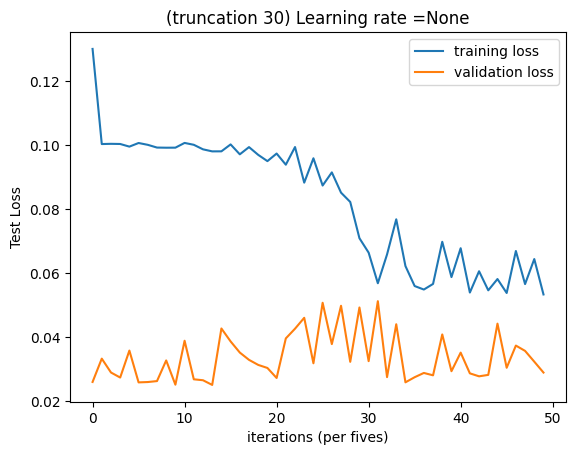

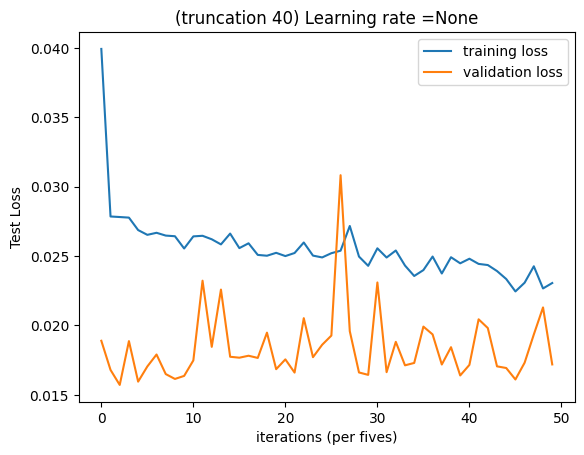

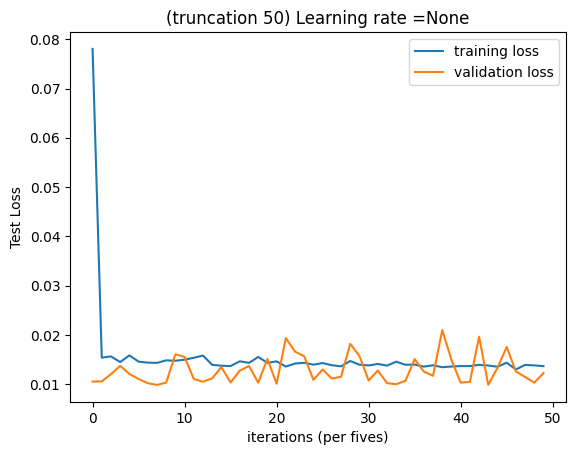

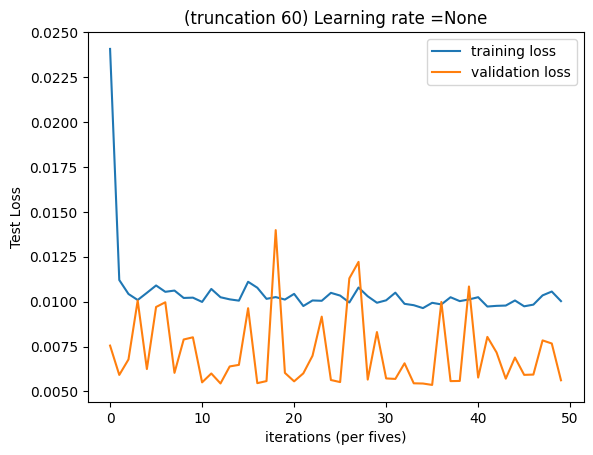

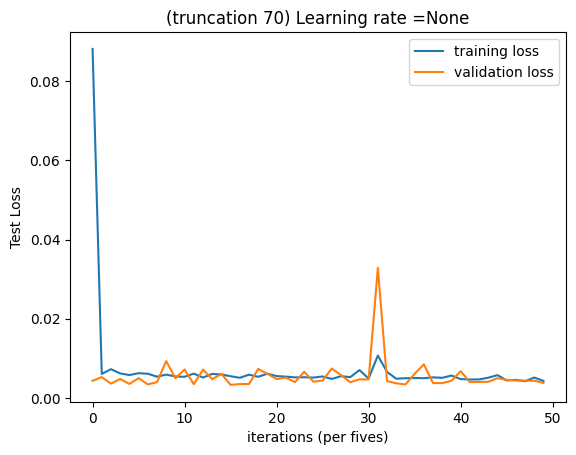

In [60]:
learning_rate = best_hps.get('learning_rate')

# Plot the train loss
for truncateN in truncateNs:
  plt.plot(np.squeeze(history[truncateN].history["loss"]), label="training loss")
  plt.ylabel('Train Loss')
  plt.xlabel('iterations (per fives)')
  plt.title(f"(truncation {truncateN}) Learning rate =" + str(learning_rate))
  # Plot the test loss
  plt.plot(np.squeeze(history[truncateN].history["val_loss"]), label="validation loss")
  plt.ylabel('Test Loss')
  plt.xlabel('iterations (per fives)')
  plt.title(f"(truncation {truncateN}) Learning rate =" + str(learning_rate))
  plt.legend()
  plt.show()


### Debugging

In [61]:
print(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION].shape)

# DEBUG: This is to check that these two tensors are indeed the same.
#yl = list(y_train.as_numpy_iterator())
#print(yl == training_set_labels)

#print(yl == training_set_labels)

"""

print(training_set_labels_unnorm.shape, train_preds.shape)

def print_samples(n):
  for i in range(n):
    print(training_set_labels_unnorm[i])
    print(train_preds[i])
print("Training set samples")
print_samples(20)

"""

print(test_set_labels_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION][0])
print(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION][0])

(335,)
41.589070785133536
0.76815975


### Unnormalize predictions

In [62]:
train_preds_unnorm, test_preds_unnorm = {}, {}
train_preds_var_unnorm, test_preds_var_unnorm = {}, {}

for truncateN in truncateNs:
  train_preds_unnorm[truncateN] = denormalize_training[truncateN](train_preds[truncateN])
  test_preds_unnorm[truncateN] = denormalize_test[truncateN](test_preds[truncateN])
  train_preds_var_unnorm[truncateN] = []
  test_preds_var_unnorm[truncateN] = []

  # Shape check
  print(train_preds_unnorm[truncateN].shape)
  print(test_preds_unnorm[truncateN].shape)

(3668,)
(459,)
(3576,)
(447,)
(3444,)
(431,)
(3108,)
(389,)
(2676,)
(335,)


## Result Visualization

### CDF of Accuracy

In [63]:
model_diffs, baseline_diffs, average_diffs = {}, {}, {}
averages = {}
        
for truncateN in truncateNs:
  print(test_preds_unnorm[truncateN])
  print(test_set_labels_unnorm[truncateN])
  print(test_preds_unnorm[truncateN].shape)
  print(test_set_labels_unnorm[truncateN].shape)
  model_diffs[truncateN] = np.abs(test_set_labels_unnorm[truncateN] - test_preds_unnorm[truncateN]) / test_set_labels_unnorm[truncateN]

  baseline = np.asarray(list(np.sum(snapshot["CurrAvgMbps"] for snapshot in series[:truncateN]) / truncateN for series in valid_serieses_map[truncateN][-len(test_preds_unnorm[truncateN]):]))
  baseline_diffs[truncateN] = np.abs(test_set_labels_unnorm[truncateN] - baseline) / test_set_labels_unnorm[truncateN]

  averages[truncateN] = (test_preds_unnorm[truncateN] + baseline) / 2
  average_diffs[truncateN] = np.abs(test_set_labels_unnorm[truncateN] - averages[truncateN]) / test_set_labels_unnorm[truncateN]

[ 15.33926873  81.56193345 105.9567385   87.43851873  28.62848431
  42.50854202  60.9465389   65.96677207   4.76849294   5.44256384
  47.25608835  89.78968642   3.5318886   58.90365437  31.80759218
  83.18358212  40.04916692   7.91879171  24.68389191  26.95794452
  22.0802587   32.18623149  83.73201833  31.57432259  14.80698317
  36.51599719  82.33334768  31.22362128  21.73649098  29.3385417
   5.59010004  25.5113175   46.17354745  29.07428144  36.92592229
  30.58060332  15.71995561  22.369568    86.1454132   82.48280475
  87.0378668   77.88743962   6.89527087  48.94691455  29.32429149
   6.91814434  30.42752003  87.56244786  82.59805877  45.17950487
  35.82825269  46.948176    14.79551622  20.07935969   3.97488623
  14.99535498  31.65187406   1.99654015  17.48972007  19.70970424
  60.94772784  53.92953097  48.93298665  71.7028789    8.55060228
   3.34472467  35.06328583  34.16601411  44.84613132  36.84379875
  39.37446606  21.97351029  29.3102309   97.15713038 178.55775234
  57.299538

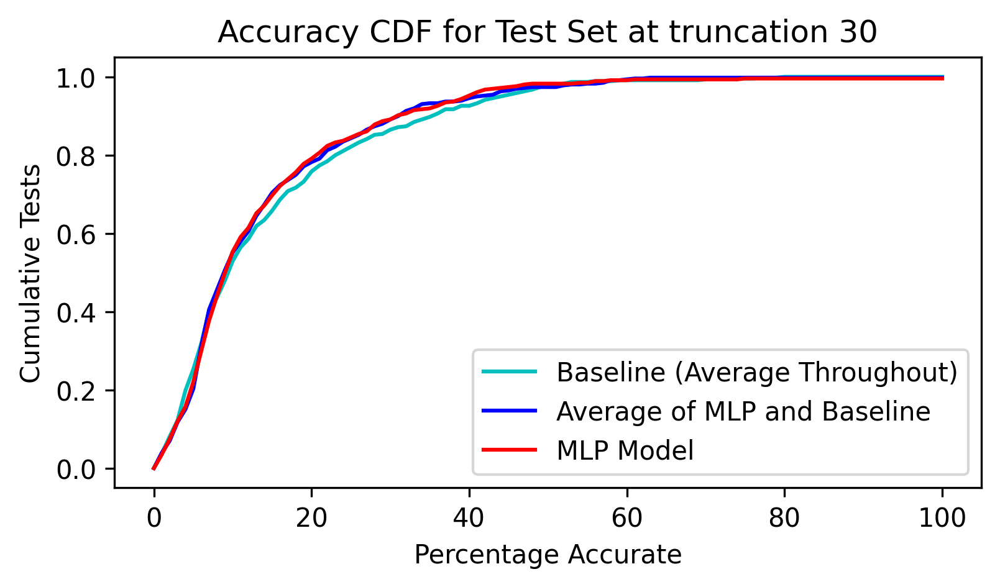

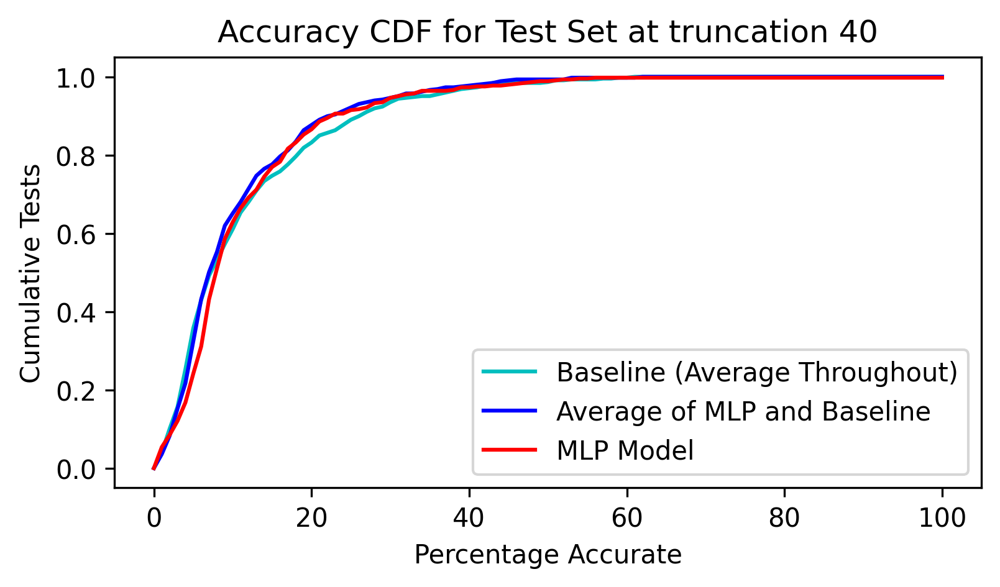

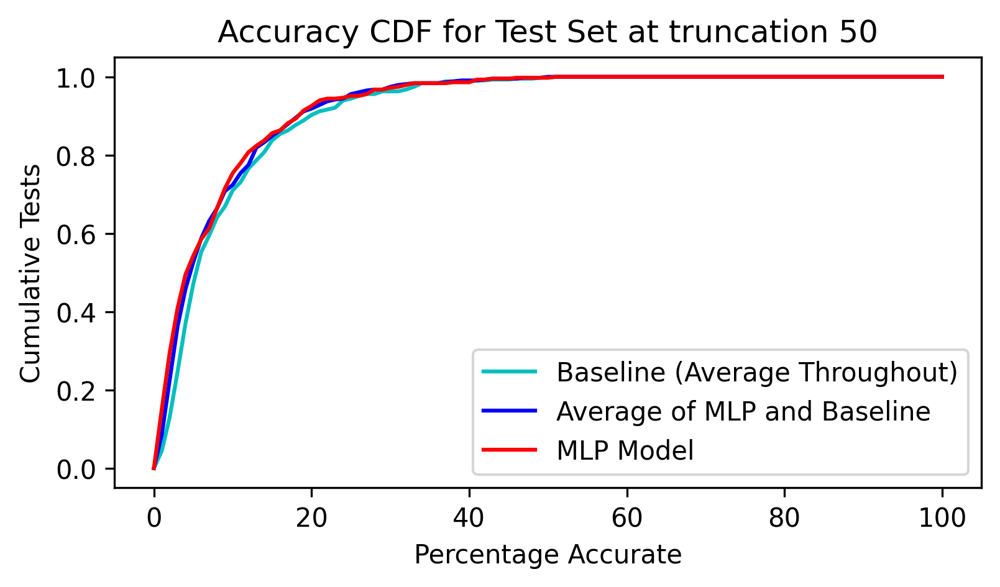

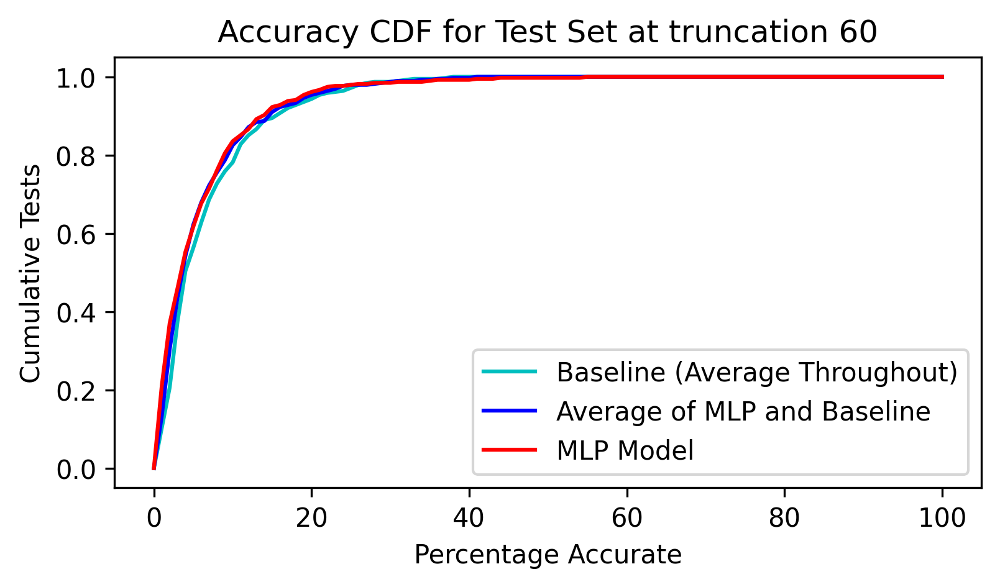

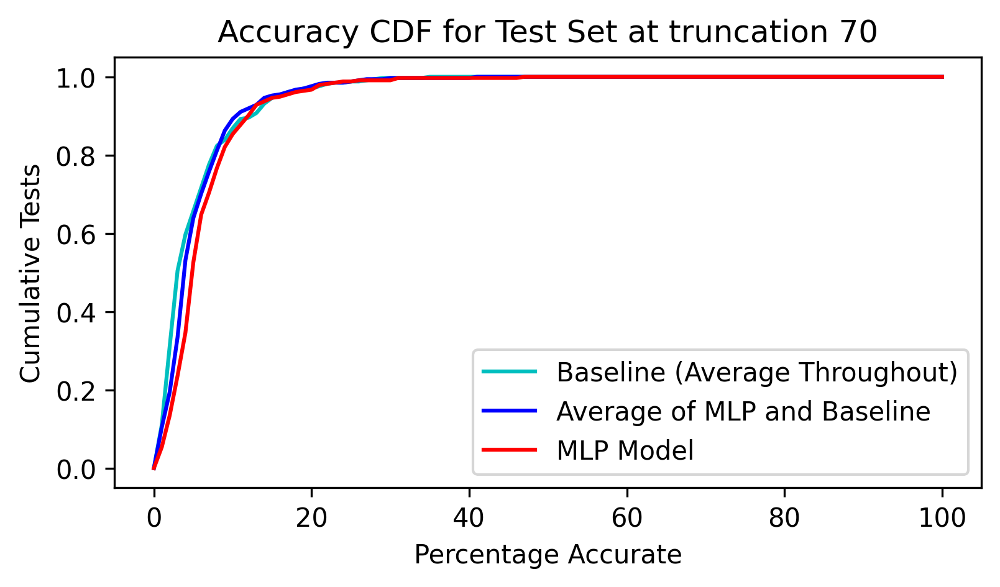

In [64]:
def get_frequencies_for_cdf(differences):
    """Returns a list of 100 percentile values.
    """
    freq = []
    for p in range(101):
        freq.append((differences < 0.01 * p).sum() / len(differences))
    return freq

for truncateN in truncateNs:
  freq = get_frequencies_for_cdf(model_diffs[truncateN])
  baseline_freq = get_frequencies_for_cdf(baseline_diffs[truncateN])
  average_freq = get_frequencies_for_cdf(average_diffs[truncateN])

  fig, ax = plt.subplots(dpi=300, figsize=(6, 3))

  ax.set_title(f"Accuracy CDF for Test Set at truncation {truncateN}")
  ax.set_xlabel("Percentage Accurate")
  ax.set_ylabel("Cumulative Tests")
  ax.plot(list(range(101)), baseline_freq, color='c', label=f"Baseline (Average Throughout)")
  ax.plot(list(range(101)), average_freq, color='b', label=f"Average of MLP and Baseline")
  ax.plot(list(range(101)), freq, color='r', label=f"MLP Model")
  plt.legend()

### Visualizations for a particular truncation

In [65]:
# Whether to enable printing the visualizations
plot_visualization = True
SNAPSHOT_TRUNC_FOR_VISUALIZATION = 50

#### Training Set

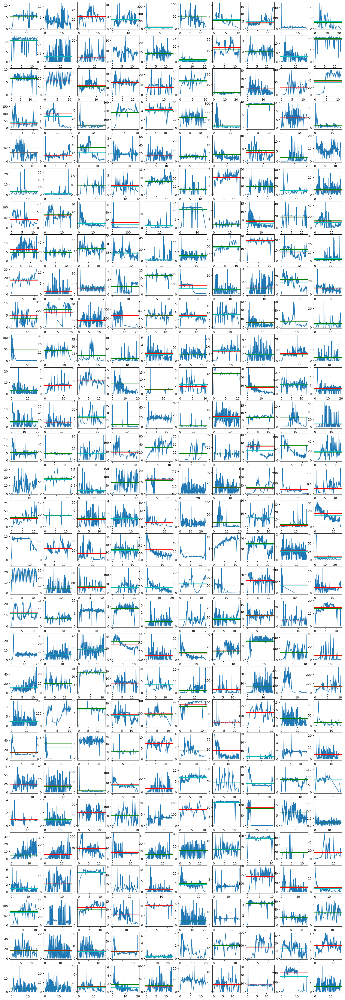

In [66]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      30, 10,
      predictedthroughputs=train_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=train_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Training Set with truncation

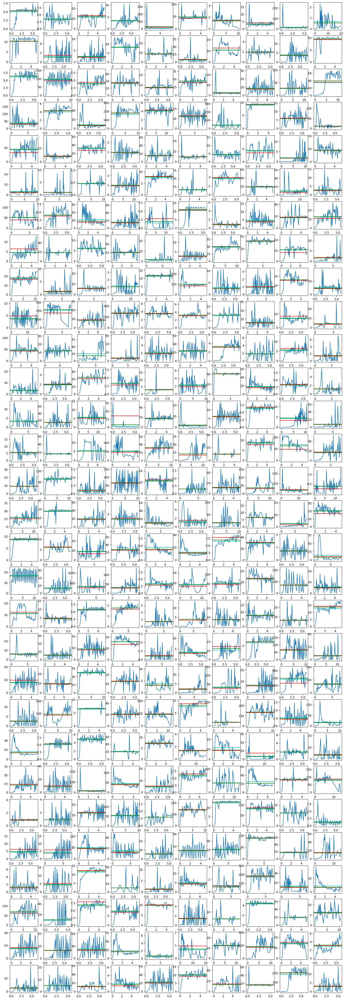

In [67]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      30, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=train_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=train_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set

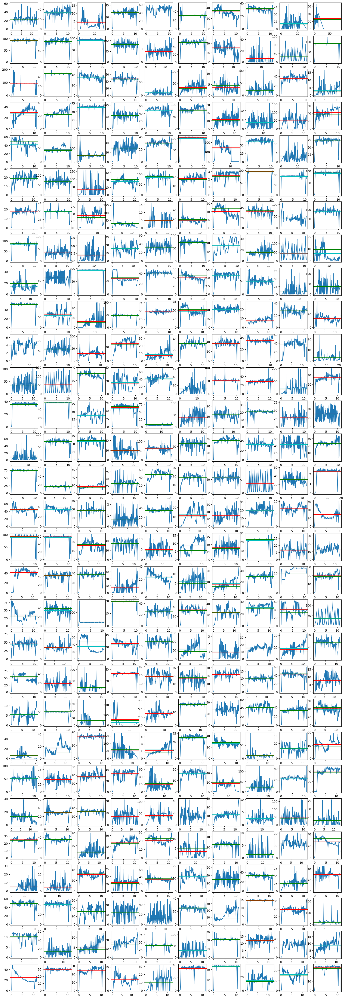

In [68]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      30, 10,
      predictedthroughputs=test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=test_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set with truncation

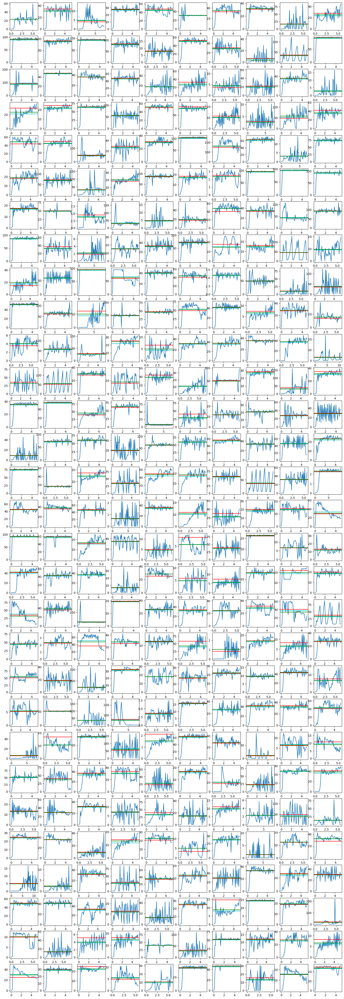

In [69]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      30, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=test_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set with truncation using Average of MLP and Baseline Predictions

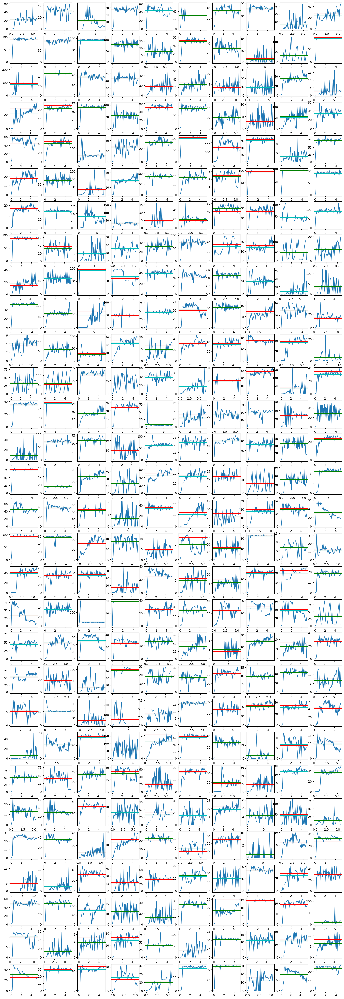

In [70]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(averages[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(averages[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      30, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=averages[SNAPSHOT_TRUNC_FOR_VISUALIZATION])